# Assignment 2: Classify the Images

In [15]:
#Importing the required libraries 
import numpy  as np  
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
import glob
import matplotlib
import keras
import random
import datetime
import os
import warnings
warnings.filterwarnings("ignore")
####################################################################################
from keras.callbacks import ReduceLROnPlateau, LearningRateScheduler, ModelCheckpoint, Callback
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Model, load_model, Sequential
from keras.layers import Input, Dense, Dropout, Flatten, BatchNormalization, TimeDistributed, LSTM
from keras.layers import Conv2D, MaxPooling2D, Activation, MaxPool2D, Convolution2D
from keras.utils import np_utils
from keras.optimizers import SGD, RMSprop, Adam, Nadam
from keras.utils.np_utils import to_categorical,normalize
from keras import backend as K
from keras import optimizers
from keras.preprocessing.image import ImageDataGenerator
from keras import regularizers
####################################################################################
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
####################################################################################
from tensorflow.keras.callbacks import TensorBoard,EarlyStopping
%load_ext tensorboard
%matplotlib inline

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [16]:
print('Numpy:',np.__version__,'\nPandas:',pd.__version__,'\nTensorFlow:',tf.__version__,'\nOpenCV:',cv2.__version__,'\nMatplotlib',matplotlib.__version__,'\nKeras:',keras.__version__)

Numpy: 1.18.5 
Pandas: 1.0.5 
TensorFlow: 2.3.0 
OpenCV: 4.1.2 
Matplotlib 3.2.2 
Keras: 2.4.3


In [17]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**Dataset Link:<br>
https://drive.google.com/file/d/176E-pLhoxTgWsJ3MeoJQV_GXczIA6g8D/view?usp=sharing**

In [18]:
!unzip -q "/content/drive/My Drive/animal_dataset_intermediate.zip"

## Preprocessing
* Adding Border (make Height=Weight)
* Resizing Image

In [19]:
def resizing(n,size=(96,96)):
    max_shape=(max(n.shape))
    delta_w = max_shape - n.shape[1]
    delta_h = max_shape - n.shape[0]
    top, bottom = delta_h//2, delta_h-(delta_h//2)
    left, right = delta_w//2, delta_w-(delta_w//2)
    temp=cv2.copyMakeBorder(n,top,bottom,left,right,
                   cv2.BORDER_REPLICATE)
    temp=cv2.resize(temp,size)
    return temp

## Import all the images
* Load images as Graysale and in RGB format too.
* Also make a vector of animal type in image.

In [20]:
cv_img_gray=[]
cv_img = []
y=[]
for img in glob.glob("/content/animal_dataset_intermediate/train/elefante_train/OIP-*"):
    n= cv2.imread(img)
    temp=resizing(n)
    gray = cv2.cvtColor(temp, cv2.COLOR_BGR2GRAY)
    cv_img.append(temp)
    cv_img_gray.append(gray)
    y.append('elephante')

for img in glob.glob("/content/animal_dataset_intermediate/train/farfalla_train/OIP-*"):
    n= cv2.imread(img)
    temp=resizing(n)
    gray = cv2.cvtColor(temp, cv2.COLOR_BGR2GRAY)
    cv_img.append(temp)
    cv_img_gray.append(gray)
    y.append('farfalla')

for img in glob.glob("/content/animal_dataset_intermediate/train/mucca_train/OIP-*"):
    n= cv2.imread(img)
    temp=resizing(n)
    gray = cv2.cvtColor(temp, cv2.COLOR_BGR2GRAY)
    cv_img.append(temp)
    cv_img_gray.append(gray)
    y.append('mucca')

for img in glob.glob("/content/animal_dataset_intermediate/train/pecora_train/OIP-*"):
    n= cv2.imread(img)
    temp=resizing(n)
    gray = cv2.cvtColor(temp, cv2.COLOR_BGR2GRAY)
    cv_img.append(temp)
    cv_img_gray.append(gray)
    y.append('pecora')

for img in glob.glob("/content/animal_dataset_intermediate/train/scoiattolo_train/OIP-*"):
    n= cv2.imread(img)
    temp=resizing(n)
    gray = cv2.cvtColor(temp, cv2.COLOR_BGR2GRAY)
    cv_img.append(temp)
    cv_img_gray.append(gray)
    y.append('scoiattolo')

for img in glob.glob("/content/animal_dataset_intermediate/train/elefante_train/*_640.*"):
    n= cv2.imread(img)
    temp=resizing(n)
    gray = cv2.cvtColor(temp, cv2.COLOR_BGR2GRAY)
    cv_img.append(temp)
    cv_img_gray.append(gray)
    y.append('elephante')

for img in glob.glob("/content/animal_dataset_intermediate/train/farfalla_train/*_640.*"):
    n= cv2.imread(img)
    temp=resizing(n)
    gray = cv2.cvtColor(temp, cv2.COLOR_BGR2GRAY)
    cv_img.append(temp)
    cv_img_gray.append(gray)
    y.append('farfalla')

for img in glob.glob("/content/animal_dataset_intermediate/train/mucca_train/*_640.*"):
    n= cv2.imread(img)
    temp=resizing(n)
    gray = cv2.cvtColor(temp, cv2.COLOR_BGR2GRAY)
    cv_img.append(temp)
    cv_img_gray.append(gray)
    y.append('mucca')

for img in glob.glob("/content/animal_dataset_intermediate/train/pecora_train/*_640.*"):
    n= cv2.imread(img)
    temp=resizing(n)
    gray = cv2.cvtColor(temp, cv2.COLOR_BGR2GRAY)
    cv_img.append(temp)
    cv_img_gray.append(gray)
    y.append('pecora')

for img in glob.glob("/content/animal_dataset_intermediate/train/scoiattolo_train/*_640.*"):
    n= cv2.imread(img)
    temp=resizing(n)
    gray = cv2.cvtColor(temp, cv2.COLOR_BGR2GRAY)
    cv_img.append(temp)
    cv_img_gray.append(gray)
    y.append('scoiattolo')

## Show random sets of images with their associated labels.

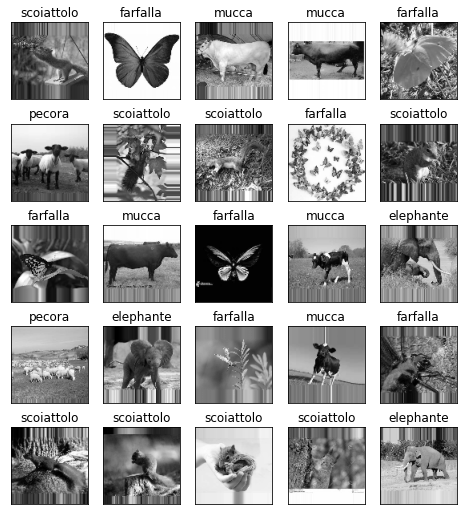

In [21]:
plt.figure(figsize=(8,9))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    rand_no = random.randint(0,len(cv_img_gray)) 
    plt.title(y[rand_no])    
    plt.imshow(cv_img_gray[rand_no], cmap = plt.cm.gray)

## MLP for grayscale images

In [22]:
# Convert list of images to Numpy Array
X_gray=np.array(cv_img_gray)
X_gray.shape

(8196, 96, 96)

In [23]:
# Import Label Encoder for encoding the Labels with numbers
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()

In [24]:
y_mod=le.fit_transform(y)
Y = to_categorical(y_mod,5)

In [25]:
# Scale images to fit between 0 and 1
X_gray=X_gray/255.0

In [26]:
# Split images into train ans test set
X_train_g, X_test_g, y_train_g, y_test_g = train_test_split(X_gray, Y, test_size=0.2, random_state=11,shuffle=True)

In [27]:
print('Training set shape:', X_train_g.shape, '\nTesting set shape:', X_test_g.shape)

Training set shape: (6556, 96, 96) 
Testing set shape: (1640, 96, 96)


In [28]:
X_train_flattened = X_train_g.reshape(len(X_train_g), X_train_g.shape[1]*X_train_g.shape[1])    # converting our 2D array representing an image to one dimensional
X_test_flattened = X_test_g.reshape(len(X_test_g), X_train_g.shape[1]*X_train_g.shape[1])

In [29]:
X_train_flattened.shape # Flattened pixel shape

(6556, 9216)

In [30]:
# Defining the model
model_gray = Sequential()
model_gray.add(Dense(8192, activation='relu',input_shape=(X_train_flattened.shape[1],)))
model_gray.add(Dense(2048, activation='relu'))
model_gray.add(Dense(1024, activation='relu'))
model_gray.add(Dense(256, activation='relu'))
model_gray.add(Dense(64, activation='relu'))
model_gray.add(Dense(5, activation='softmax'))
model_gray.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8192)              75505664  
_________________________________________________________________
dense_1 (Dense)              (None, 2048)              16779264  
_________________________________________________________________
dense_2 (Dense)              (None, 1024)              2098176   
_________________________________________________________________
dense_3 (Dense)              (None, 256)               262400    
_________________________________________________________________
dense_4 (Dense)              (None, 64)                16448     
_________________________________________________________________
dense_5 (Dense)              (None, 5)                 325       
Total params: 94,662,277
Trainable params: 94,662,277
Non-trainable params: 0
____________________________________________

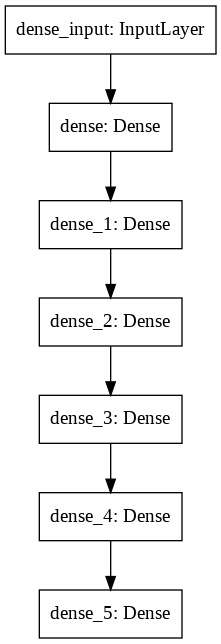

In [31]:
from tensorflow.keras.utils import plot_model
plot_model(model_gray)

In [32]:
# Compiling the model
model_gray.compile(optimizer='adam',
                                      loss='categorical_crossentropy',
                                      metrics=['accuracy'])

es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=12, 
                                               restore_best_weights=True,
                                               verbose=1)
# Fit the model
history = model_gray.fit(X_train_flattened, y_train_g,
                                             validation_data=(X_test_flattened, y_test_g),
                                             callbacks=[es_callback],
                                              batch_size=32,
                                              epochs = 50)

Epoch 1/50
205/205 [==============================] - 5s 25ms/step - loss: 2.6854 - accuracy: 0.2512 - val_loss: 1.5505 - val_accuracy: 0.2604
Epoch 2/50
205/205 [==============================] - 5s 24ms/step - loss: 1.5129 - accuracy: 0.3103 - val_loss: 1.5224 - val_accuracy: 0.3207
Epoch 3/50
205/205 [==============================] - 5s 24ms/step - loss: 1.4709 - accuracy: 0.3507 - val_loss: 1.4619 - val_accuracy: 0.3573
Epoch 4/50
205/205 [==============================] - 5s 23ms/step - loss: 1.4386 - accuracy: 0.3652 - val_loss: 1.4303 - val_accuracy: 0.3726
Epoch 5/50
205/205 [==============================] - 5s 23ms/step - loss: 1.4199 - accuracy: 0.3745 - val_loss: 1.4228 - val_accuracy: 0.3841
Epoch 6/50
205/205 [==============================] - 5s 22ms/step - loss: 1.3984 - accuracy: 0.3909 - val_loss: 1.4466 - val_accuracy: 0.3640
Epoch 7/50
205/205 [==============================] - 5s 23ms/step - loss: 1.3750 - accuracy: 0.4050 - val_loss: 1.4175 - val_accuracy: 0.4024

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


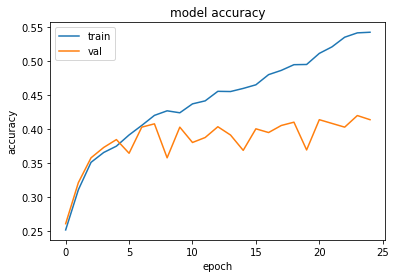

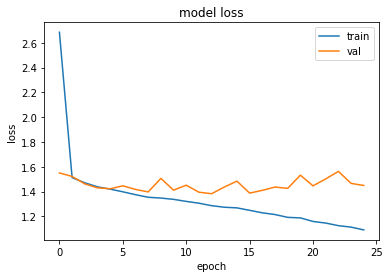

In [33]:
print(history.history.keys())
#  Ploting the accuracy graph
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='best')
plt.show()
# Ploting the loss graph
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='best')
plt.show()

In [34]:
# Defining the model
model_gray2 = Sequential()
model_gray2.add(Dense(8192, activation='elu',input_shape=(X_train_flattened.shape[1],)))
model_gray2.add(Dense(2048, activation='elu'))
model_gray2.add(Dense(1024, activation='elu'))
model_gray2.add(Dense(256, activation='elu'))
model_gray2.add(Dense(64, activation='elu'))
model_gray2.add(Dense(5, activation='softmax'))
model_gray2.summary()
# Compiling the model
model_gray2.compile(optimizer='adam',
                                      loss='categorical_crossentropy',
                                      metrics=['accuracy'])

es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=12, 
                                               restore_best_weights=True,
                                               verbose=1)
# Fit the model
history = model_gray2.fit(X_train_flattened, y_train_g,
                                             validation_data=(X_test_flattened, y_test_g),
                                             callbacks=[es_callback],
                                              batch_size=32,
                                              epochs = 50)

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_6 (Dense)              (None, 8192)              75505664  
_________________________________________________________________
dense_7 (Dense)              (None, 2048)              16779264  
_________________________________________________________________
dense_8 (Dense)              (None, 1024)              2098176   
_________________________________________________________________
dense_9 (Dense)              (None, 256)               262400    
_________________________________________________________________
dense_10 (Dense)             (None, 64)                16448     
_________________________________________________________________
dense_11 (Dense)             (None, 5)                 325       
Total params: 94,662,277
Trainable params: 94,662,277
Non-trainable params: 0
__________________________________________

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


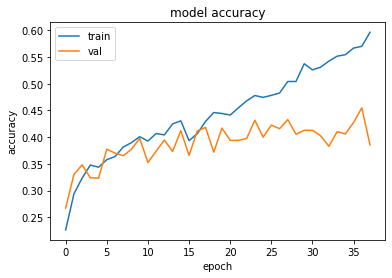

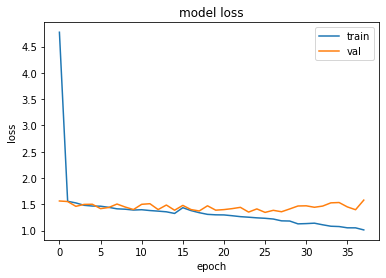

In [35]:
print(history.history.keys())
#  Ploting the accuracy graph
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='best')
plt.show()
# Ploting the loss graph
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='best')
plt.show()

In [37]:
# Defining the model
model_gray3 = Sequential()
model_gray3.add(Dense(8192, activation='sigmoid',input_shape=(X_train_flattened.shape[1],)))
model_gray3.add(Dense(2048, activation='sigmoid'))
model_gray3.add(Dense(1024, activation='sigmoid'))
model_gray3.add(Dense(256, activation=r'sigmoid'))
model_gray3.add(Dense(64, activation='sigmoid'))
model_gray3.add(Dense(5, activation='softmax'))
model_gray3.summary()
# Compiling the model
model_gray3.compile(optimizer='adam',
                                      loss='categorical_crossentropy',
                                      metrics=['accuracy'])

es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=12, 
                                               restore_best_weights=True,
                                               verbose=1)
# Fit the model
history = model_gray3.fit(X_train_flattened, y_train_g,
                                             validation_data=(X_test_flattened, y_test_g),
                                             callbacks=[es_callback],
                                              batch_size=16,
                                              epochs = 50)

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18 (Dense)             (None, 8192)              75505664  
_________________________________________________________________
dense_19 (Dense)             (None, 2048)              16779264  
_________________________________________________________________
dense_20 (Dense)             (None, 1024)              2098176   
_________________________________________________________________
dense_21 (Dense)             (None, 256)               262400    
_________________________________________________________________
dense_22 (Dense)             (None, 64)                16448     
_________________________________________________________________
dense_23 (Dense)             (None, 5)                 325       
Total params: 94,662,277
Trainable params: 94,662,277
Non-trainable params: 0
__________________________________________

KeyboardInterrupt: ignored

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


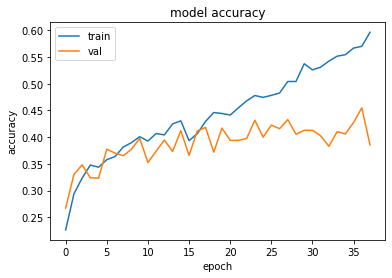

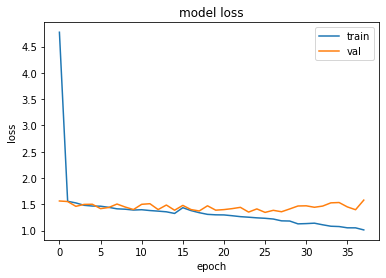

In [38]:
print(history.history.keys())
#  Ploting the accuracy graph
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='best')
plt.show()
# Ploting the loss graph
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='best')
plt.show()

In [45]:
# Defining the model
model_gray4 = Sequential()

model_gray4.add(Dense(8192, activation='relu',input_shape=(X_train_flattened.shape[1],)))
model_gray4.add(BatchNormalization())
model_gray4.add(Dropout(0.2))

model_gray4.add(Dense(2048, activation='relu'))
model_gray4.add(Dense(1024, activation='relu'))
model_gray4.add(BatchNormalization())
model_gray4.add(Dropout(0.2))

model_gray4.add(Dense(256, activation='relu'))
model_gray4.add(Dense(32, activation='relu'))
model_gray4.add(BatchNormalization())
model_gray4.add(Dropout(0.2))

model_gray4.add(Dense(5, activation='softmax'))

model_gray4.summary()

# Compiling the model
model_gray4.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, 
                                               restore_best_weights=True,
                                               verbose=1)
# Fit the model
#model_gray.fit(X_train_flattened, y_train_g, batch_size= 128,epochs=50)

history = model_gray4.fit(X_train_flattened, y_train_g,
                                             validation_data=(X_test_flattened, y_test_g),
                                             callbacks=[es_callback],
                                              batch_size=32,
                                              epochs = 50)

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_24 (Dense)             (None, 8192)              75505664  
_________________________________________________________________
batch_normalization (BatchNo (None, 8192)              32768     
_________________________________________________________________
dropout (Dropout)            (None, 8192)              0         
_________________________________________________________________
dense_25 (Dense)             (None, 2048)              16779264  
_________________________________________________________________
dense_26 (Dense)             (None, 1024)              2098176   
_________________________________________________________________
batch_normalization_1 (Batch (None, 1024)              4096      
_________________________________________________________________
dropout_1 (Dropout)          (None, 1024)             

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


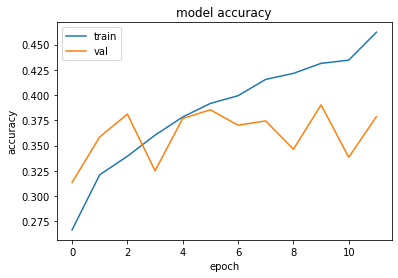

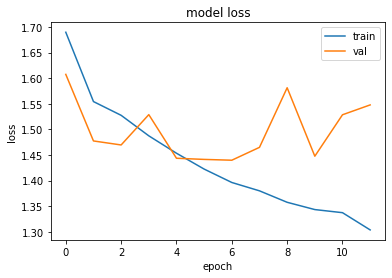

In [46]:
print(history.history.keys())
#  Ploting the accuracy graph
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='best')
plt.show()
# Ploting the loss graph
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='best')
plt.show()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_30 (Dense)             (None, 8192)              75505664  
_________________________________________________________________
batch_normalization_3 (Batch (None, 8192)              32768     
_________________________________________________________________
dropout_3 (Dropout)          (None, 8192)              0         
_________________________________________________________________
dense_31 (Dense)             (None, 2048)              16779264  
_________________________________________________________________
dense_32 (Dense)             (None, 1024)              2098176   
_________________________________________________________________
batch_normalization_4 (Batch (None, 1024)              4096      
_________________________________________________________________
dropout_4 (Dropout)          (None, 1024)             

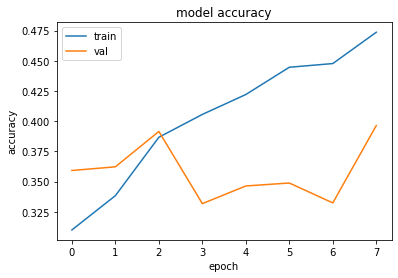

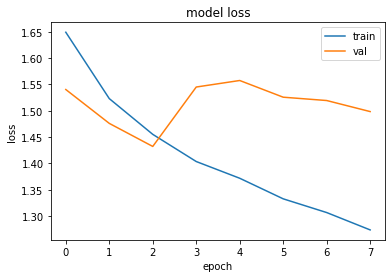

In [47]:
# Defining the model
model_gray5 = Sequential()

model_gray5.add(Dense(8192, activation='elu',input_shape=(X_train_flattened.shape[1],)))
model_gray5.add(BatchNormalization())
model_gray5.add(Dropout(0.2))

model_gray5.add(Dense(2048, activation='elu'))
model_gray5.add(Dense(1024, activation='elu'))
model_gray5.add(BatchNormalization())
model_gray5.add(Dropout(0.2))

model_gray5.add(Dense(256, activation='elu'))
model_gray5.add(Dense(32, activation='elu'))
model_gray5.add(BatchNormalization())
model_gray5.add(Dropout(0.2))

model_gray5.add(Dense(5, activation='softmax'))

model_gray5.summary()

# Compiling the model
model_gray5.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, 
                                               restore_best_weights=True,
                                               verbose=1)
# Fit the model
#model_gray.fit(X_train_flattened, y_train_g, batch_size= 128,epochs=50)

history = model_gray5.fit(X_train_flattened, y_train_g,
                                             validation_data=(X_test_flattened, y_test_g),
                                             callbacks=[es_callback],
                                              batch_size=32,
                                              epochs = 50)

print(history.history.keys())
#  Ploting the accuracy graph
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='best')
plt.show()
# Ploting the loss graph
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='best')
plt.show()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_42 (Dense)             (None, 8192)              75505664  
_________________________________________________________________
dense_43 (Dense)             (None, 2048)              16779264  
_________________________________________________________________
dense_44 (Dense)             (None, 1024)              2098176   
_________________________________________________________________
dense_45 (Dense)             (None, 256)               262400    
_________________________________________________________________
dense_46 (Dense)             (None, 64)                16448     
_________________________________________________________________
dense_47 (Dense)             (None, 5)                 325       
Total params: 94,662,277
Trainable params: 94,662,277
Non-trainable params: 0
__________________________________________

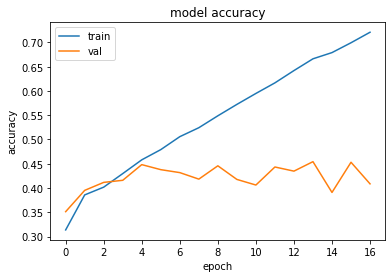

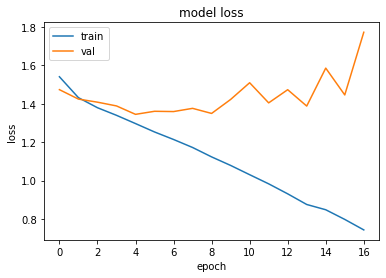

In [50]:
# Defining the model
model_gray6 = Sequential()
model_gray6.add(Dense(8192, activation='elu',input_shape=(X_train_flattened.shape[1],)))
model_gray6.add(Dense(2048, activation='elu'))
model_gray6.add(Dense(1024, activation='elu'))
model_gray6.add(Dense(256, activation='elu'))
model_gray6.add(Dense(64, activation='elu'))
model_gray6.add(Dense(5, activation='softmax'))
model_gray6.summary()

sgd=SGD(lr=0.001, decay=1e-6, momentum=0.9, nesterov=True)

# Compiling the model
model_gray6.compile(optimizer=sgd,
                                      loss='categorical_crossentropy',
                                      metrics=['accuracy'])

es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=12, 
                                               restore_best_weights=True,
                                               verbose=1)
# Fit the model
history = model_gray6.fit(X_train_flattened, y_train_g,
                                             validation_data=(X_test_flattened, y_test_g),
                                             callbacks=[es_callback],
                                              batch_size=32,
                                              epochs = 50)

print(history.history.keys())
#  Ploting the accuracy graph
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='best')
plt.show()
# Ploting the loss graph
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='best')
plt.show()

In [54]:
print('Optimiser=Adam')
print('***********************************************************************')
print('Relu :\n',model_gray.evaluate(X_test_flattened, y_test_g))
print('Elu :\n',model_gray2.evaluate(X_test_flattened, y_test_g))
print('Sigmoid :\n',model_gray3.evaluate(X_test_flattened, y_test_g))
print('Relu with Dropout:\n',model_gray4.evaluate(X_test_flattened, y_test_g))
print('Elu with Dropout:\n',model_gray5.evaluate(X_test_flattened, y_test_g))
print('\n\nOptimiser=SGD')
print('***********************************************************************')
print('Elu:\n',model_gray6.evaluate(X_test_flattened, y_test_g))

Optimiser=Adam
***********************************************************************
52/52 [==============================] - 0s 5ms/step - loss: 1.3828 - accuracy: 0.4030
Relu :
 [1.3827989101409912, 0.4030487835407257]
52/52 [==============================] - 0s 5ms/step - loss: 1.3458 - accuracy: 0.4226
Elu :
 [1.3457629680633545, 0.42256098985671997]
103/103 [==============================] - 0s 4ms/step - loss: 1.6073 - accuracy: 0.2360
Sigmoid :
 [1.607277274131775, 0.23597560822963715]
52/52 [==============================] - 0s 4ms/step - loss: 1.4397 - accuracy: 0.3701
Relu with Dropout:
 [1.439669132232666, 0.37012195587158203]
52/52 [==============================] - 0s 4ms/step - loss: 1.4323 - accuracy: 0.3915
Elu with Dropout:
 [1.4323269128799438, 0.39146342873573303]


Optimiser=SGD
***********************************************************************
52/52 [==============================] - 0s 4ms/step - loss: 1.3450 - accuracy: 0.4482
Elu:
 [1.3449525833129883, 0.

<hr><hr>

## CNN

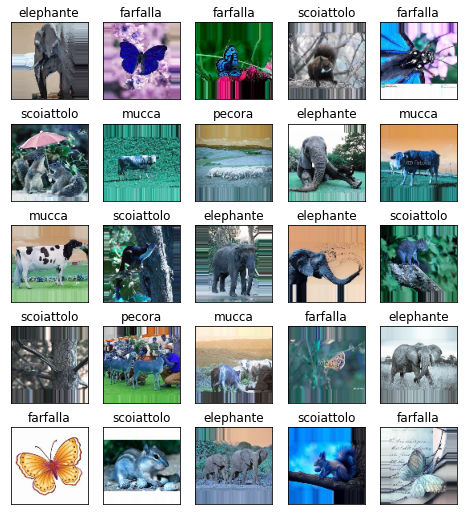

In [55]:
plt.figure(figsize=(8,9))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    rand_no = random.randint(0,len(cv_img)) 
    plt.title(y[rand_no])    
    plt.imshow(cv_img[rand_no])

In [56]:
X=np.array(cv_img)
X.shape

(8196, 96, 96, 3)

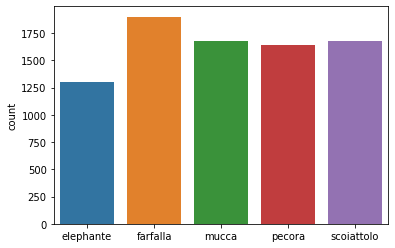

In [57]:
sns.countplot(y)

In [58]:
X=X/255.0

In [59]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=2,shuffle=True)

In [60]:
datagen = ImageDataGenerator(
            #rescale=1.0/255.0,
            zoom_range=0.1,
            featurewise_center=False,  # set input mean to 0 over the dataset
            samplewise_center=False,  # set each sample mean to 0
            featurewise_std_normalization=False,  # divide inputs by std of the dataset
            samplewise_std_normalization=False,  # divide each input by its std
            zca_whitening=False,  # apply ZCA whitening
            rotation_range=10,  # randomly rotate images in the range (degrees, 0 to 180)
            width_shift_range=0.1,  # randomly shift images horizontally (fraction of total width)
            height_shift_range=0.1,  # randomly shift images vertically (fraction of total height)
            horizontal_flip=True,  # randomly flip images
            vertical_flip=False)  # randomly flip images
        # (std, mean, and principal components if ZCA whitening is applied).
datagen.fit(X_train)

Epoch 1/15
204/204 [==============================] - 14s 69ms/step - loss: 1.8988 - accuracy: 0.4502 - val_loss: 1.1012 - val_accuracy: 0.5909
Epoch 2/15
204/204 [==============================] - 14s 69ms/step - loss: 1.1089 - accuracy: 0.5475 - val_loss: 1.2178 - val_accuracy: 0.5555
Epoch 3/15
204/204 [==============================] - 14s 69ms/step - loss: 1.0359 - accuracy: 0.5891 - val_loss: 1.1229 - val_accuracy: 0.5689
Epoch 4/15
204/204 [==============================] - 14s 69ms/step - loss: 1.0144 - accuracy: 0.5927 - val_loss: 1.0470 - val_accuracy: 0.6146
Epoch 5/15
204/204 [==============================] - 14s 68ms/step - loss: 0.9793 - accuracy: 0.6101 - val_loss: 0.9567 - val_accuracy: 0.6470
Epoch 6/15
204/204 [==============================] - 14s 68ms/step - loss: 0.9417 - accuracy: 0.6283 - val_loss: 0.9758 - val_accuracy: 0.6488
Epoch 7/15
204/204 [==============================] - 14s 69ms/step - loss: 0.9360 - accuracy: 0.6314 - val_loss: 0.9895 - val_accuracy:

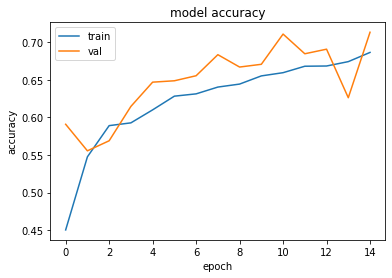

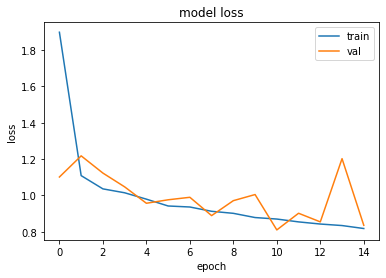

In [61]:
# Creating a Sequential Model and adding the layers
model_cnn = Sequential()
model_cnn.add(Conv2D(64, kernel_size=(3,3), input_shape=X_train.shape[1:],))
model_cnn.add(Activation('relu'))
model_cnn.add(MaxPooling2D(pool_size=(2, 2)))
model_cnn.add(Flatten()) # Flattening the 2D arrays for fully connected layers
model_cnn.add(Dense(128, activation=tf.nn.relu))
model_cnn.add(Dropout(0.2))
model_cnn.add(Dense(5,activation=tf.nn.softmax))

#Training
model_cnn.compile(optimizer='adam', 
              loss='categorical_crossentropy', 
              metrics=['accuracy'])
history = model_cnn.fit(datagen.flow(X_train, y_train, batch_size=32),
                              steps_per_epoch=X_train.shape[0] // 32,
                              validation_data=(X_test, y_test),
                              epochs = 15, 
                              verbose=1)

print(history.history.keys())
#  Ploting the accuracy graph
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='best')
plt.show()
# Ploting the loss graph
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='best')
plt.show()

Epoch 1/15
204/204 [==============================] - 15s 73ms/step - loss: 1.4316 - accuracy: 0.3944 - val_loss: 1.2368 - val_accuracy: 0.5183
Epoch 2/15
204/204 [==============================] - 15s 72ms/step - loss: 1.1419 - accuracy: 0.5259 - val_loss: 0.9847 - val_accuracy: 0.5835
Epoch 3/15
204/204 [==============================] - 15s 71ms/step - loss: 1.0422 - accuracy: 0.5711 - val_loss: 1.1955 - val_accuracy: 0.5567
Epoch 4/15
204/204 [==============================] - 15s 73ms/step - loss: 0.9804 - accuracy: 0.6108 - val_loss: 0.8855 - val_accuracy: 0.6494
Epoch 5/15
204/204 [==============================] - 15s 72ms/step - loss: 0.9310 - accuracy: 0.6278 - val_loss: 0.9862 - val_accuracy: 0.6220
Epoch 6/15
204/204 [==============================] - 15s 72ms/step - loss: 0.8851 - accuracy: 0.6398 - val_loss: 0.7957 - val_accuracy: 0.6939
Epoch 7/15
204/204 [==============================] - 15s 72ms/step - loss: 0.8311 - accuracy: 0.6790 - val_loss: 0.9513 - val_accuracy:

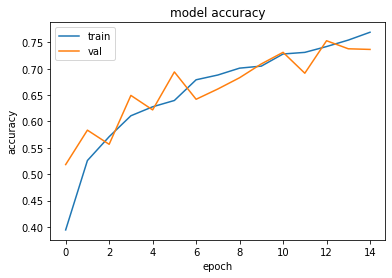

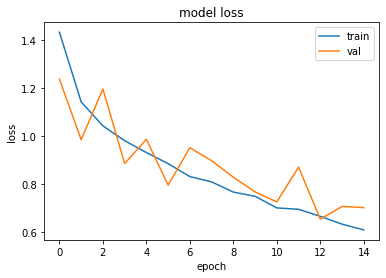

In [63]:
model_cnn_2 = Sequential()

  # Model layers
model_cnn_2.add(Conv2D(16,kernel_size=5,padding='same',activation='relu', input_shape=X_train.shape[1:],))
model_cnn_2.add(MaxPool2D())
model_cnn_2.add(Conv2D(32,kernel_size=5,padding='same',activation='relu'))
model_cnn_2.add(MaxPool2D())
model_cnn_2.add(Conv2D(256,kernel_size=5,padding='same',activation='relu'))
model_cnn_2.add(MaxPool2D(padding='same'))
model_cnn_2.add(Flatten())
model_cnn_2.add(Dense(1024, activation='relu'))
model_cnn_2.add(Dropout(0.4))
model_cnn_2.add(Dense(5, activation='softmax'))
model_cnn_2.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])

history = model_cnn_2.fit(datagen.flow(X_train, y_train, batch_size=32),
                              steps_per_epoch=X_train.shape[0] // 32,
                              validation_data=(X_test, y_test),
                              epochs = 15, 
                              verbose=1)

print(history.history.keys())
#  Ploting the accuracy graph
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='best')
plt.show()
# Ploting the loss graph
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='best')
plt.show()

Epoch 1/15
204/204 [==============================] - 18s 88ms/step - loss: 1.9973 - accuracy: 0.3527 - val_loss: 2.8779 - val_accuracy: 0.2043
Epoch 2/15
204/204 [==============================] - 17s 83ms/step - loss: 1.3822 - accuracy: 0.4277 - val_loss: 1.8632 - val_accuracy: 0.2902
Epoch 3/15
204/204 [==============================] - 17s 83ms/step - loss: 1.2794 - accuracy: 0.4700 - val_loss: 1.2694 - val_accuracy: 0.4848
Epoch 4/15
204/204 [==============================] - 17s 82ms/step - loss: 1.2129 - accuracy: 0.5060 - val_loss: 1.3177 - val_accuracy: 0.4488
Epoch 5/15
204/204 [==============================] - 17s 83ms/step - loss: 1.1393 - accuracy: 0.5279 - val_loss: 1.1312 - val_accuracy: 0.5518
Epoch 6/15
204/204 [==============================] - 17s 83ms/step - loss: 1.0954 - accuracy: 0.5452 - val_loss: 1.2636 - val_accuracy: 0.4982
Epoch 7/15
204/204 [==============================] - 17s 83ms/step - loss: 1.0580 - accuracy: 0.5788 - val_loss: 1.6176 - val_accuracy:

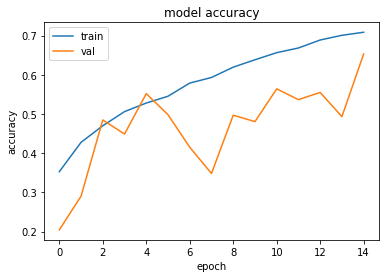

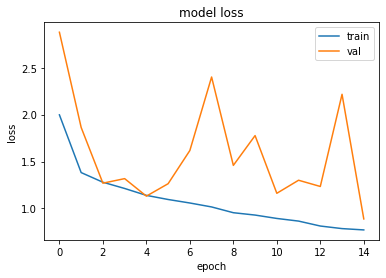

In [67]:
model_cnn_3 = Sequential()
    
model_cnn_3.add(Conv2D(32, kernel_size=(3, 3), padding="same", activation='relu',
                            data_format="channels_last",input_shape=X_train.shape[1:],))
model_cnn_3.add(Conv2D(32, kernel_size=(3, 3), padding="same", activation='relu'))
model_cnn_3.add(Conv2D(32, kernel_size=(3, 3), padding="same", activation='relu'))
model_cnn_3.add(BatchNormalization())
model_cnn_3.add(MaxPool2D(pool_size=(2, 2)))
model_cnn_3.add(Dropout(0.2))

model_cnn_3.add(Conv2D(64, kernel_size=(3, 3), padding="same", activation='relu'))
model_cnn_3.add(Conv2D(64, kernel_size=(3, 3), padding="same", activation='relu'))
model_cnn_3.add(Conv2D(64, kernel_size=(3, 3), padding="same", activation='relu'))
model_cnn_3.add(BatchNormalization())
model_cnn_3.add(MaxPool2D(pool_size=(2, 2)))
model_cnn_3.add(Dropout(0.2))

model_cnn_3.add(Conv2D(128, kernel_size=(3, 3), padding="same", activation='relu'))
model_cnn_3.add(Conv2D(128, kernel_size=(3, 3), padding="same", activation='relu'))
model_cnn_3.add(Conv2D(128, kernel_size=(3, 3), padding="same", activation='relu'))
model_cnn_3.add(BatchNormalization())
model_cnn_3.add(MaxPool2D(pool_size=(2, 2)))
model_cnn_3.add(Dropout(0.2))

model_cnn_3.add(Conv2D(256, kernel_size=(3, 3), padding="same", activation='relu'))
model_cnn_3.add(Conv2D(256, kernel_size=(3, 3), padding="same", activation='relu'))
model_cnn_3.add(Conv2D(256, kernel_size=(3, 3), padding="same", activation='relu'))
model_cnn_3.add(BatchNormalization())
model_cnn_3.add(MaxPool2D(pool_size=(2, 2)))
model_cnn_3.add(Dropout(0.2))

model_cnn_3.add(Flatten())
model_cnn_3.add(Dense(512, activation='relu'))
model_cnn_3.add(Dense(512, activation='relu'))
model_cnn_3.add(Dropout(0.5))
model_cnn_3.add(Dense(5, activation='softmax'))
    
#sgd=SGD(lr=0.01, decay=1e-6, momentum=0.9, nesterov=True)
model_cnn_3.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

history = model_cnn_3.fit(datagen.flow(X_train, y_train, batch_size=32),
                              steps_per_epoch=X_train.shape[0] // 32,
                              validation_data=(X_test, y_test),
                              epochs = 15, 
                              verbose=1)

print(history.history.keys())
#  Ploting the accuracy graph
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='best')
plt.show()
# Ploting the loss graph
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='best')
plt.show()

In [ ]:
        model = Sequential()
        weight_decay = 0.0005

        model.add(Conv2D(64, (3, 3), padding='same',
                         kernel_regularizer=regularizers.l2(weight_decay),input_shape=X_train.shape[1:],))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.3))

        model.add(Conv2D(64, (3, 3), padding='same',kernel_regularizer=regularizers.l2(weight_decay)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(MaxPooling2D(pool_size=(2, 2)))
        model.add(Conv2D(128, (3, 3), padding='same',kernel_regularizer=regularizers.l2(weight_decay)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.4))

        model.add(Conv2D(128, (3, 3), padding='same',kernel_regularizer=regularizers.l2(weight_decay)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(MaxPooling2D(pool_size=(2, 2)))
        model.add(Conv2D(256, (3, 3), padding='same',kernel_regularizer=regularizers.l2(weight_decay)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.4))

        model.add(Conv2D(256, (3, 3), padding='same',kernel_regularizer=regularizers.l2(weight_decay)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.4))
        
        model.add(Conv2D(256, (3, 3), padding='same',kernel_regularizer=regularizers.l2(weight_decay)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(MaxPooling2D(pool_size=(2, 2)))
        model.add(Conv2D(512, (3, 3), padding='same',kernel_regularizer=regularizers.l2(weight_decay)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.4))

        model.add(Conv2D(512, (3, 3), padding='same',kernel_regularizer=regularizers.l2(weight_decay)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.4))

        model.add(Conv2D(512, (3, 3), padding='same',kernel_regularizer=regularizers.l2(weight_decay)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(MaxPooling2D(pool_size=(2, 2)))
        model.add(Conv2D(512, (3, 3), padding='same',kernel_regularizer=regularizers.l2(weight_decay)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.4))

        model.add(Conv2D(512, (3, 3), padding='same',kernel_regularizer=regularizers.l2(weight_decay)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.4))
        model.add(Conv2D(512, (3, 3), padding='same',kernel_regularizer=regularizers.l2(weight_decay)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(MaxPooling2D(pool_size=(2, 2)))
        model.add(Dropout(0.5))

        model.add(Flatten())
        model.add(Dense(512,kernel_regularizer=regularizers.l2(weight_decay)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.5))
        
        model.add(Dense(5))
        model.add(Activation('softmax'))

        learning_rate = 0.1
        lr_decay = 1e-6
        lr_drop = 20

        sgd = optimizers.SGD(lr=learning_rate, decay=lr_decay, momentum=0.9, nesterov=True)
        #model.compile(loss='categorical_crossentropy', optimizer=optimizers.Adam(amsgrad=True,lr=0.0015), metrics=['accuracy'])
        model.compile(loss='categorical_crossentropy', optimizer=sgd, metrics=['accuracy'])

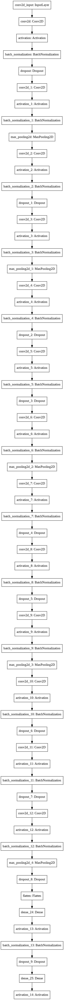

In [ ]:
plot_model(model)

In [ ]:
def lr_scheduler(epoch):
    return learning_rate * (0.5 ** (epoch // lr_drop))
reduce_lr = keras.callbacks.LearningRateScheduler(lr_scheduler)

In [ ]:
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
#tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

filepath="basic.hdf5"    #"weights-improvement-trial5-{epoch:02d}.hdf5"
checkpoint = ModelCheckpoint(filepath,monitor='val_loss', verbose=1, mode='auto',save_best_only=True)

#logdir = os.path.join("logs4_load2", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [ ]:
history = model.fit(datagen.flow(X_train, y_train, batch_size=32),
                              steps_per_epoch=X_train.shape[0] // 32,
                              validation_data=(X_test, y_test),
                              epochs = 100, 
                              callbacks=[reduce_lr, tensorboard_callback,checkpoint],
                              verbose=1)

Epoch 1/100
  1/204 [..............................] - ETA: 0s - loss: 4.8263 - accuracy: 0.2812WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.
204/204 [==============================] - ETA: 0s - loss: 95.7818 - accuracy: 0.2581
Epoch 00001: val_loss improved from inf to 83.14682, saving model to basic.hdf5
204/204 [==============================] - 28s 136ms/step - loss: 95.7818 - accuracy: 0.2581 - val_loss: 83.1468 - val_accuracy: 0.2506
Epoch 2/100
204/204 [==============================] - ETA: 0s - loss: 68.3774 - accuracy: 0.3260
Epoch 00002: val_loss improved from 83.14682 to 55.50969, saving model to basic.hdf5
204/204 [==============================] - 26s 129ms/step - loss: 68.3774 - accuracy: 0.3260 - val_loss: 55.5097 - val_accuracy: 0.2573
Epoch

In [ ]:
model1=load_model('basic.hdf5')

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])


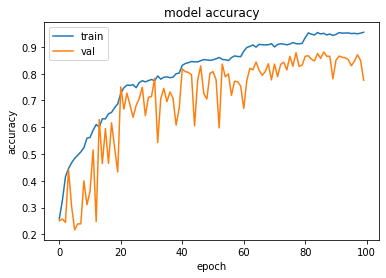

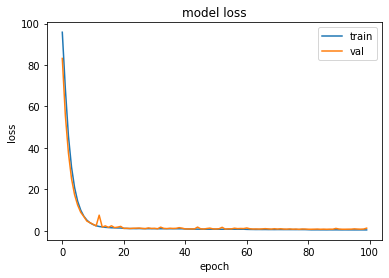

In [ ]:
print(history.history.keys())
#  Ploting the accuracy graph
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='best')
plt.show()
# Ploting the loss graph
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='best')
plt.show()

In [ ]:
%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

In [ ]:
test_file=pd.read_csv('animal_dataset_intermediate/Testing_set_animals.csv')
test_img=[]
for i in test_file['filename']:
    n= cv2.imread('animal_dataset_intermediate/test/'+i)
    temp=resizing(n)
    test_img.append(temp)

In [ ]:
test=np.array(test_img)/255.0

In [ ]:
result=pd.DataFrame(le.inverse_transform(np.argmax(model.predict(test), axis=1)))

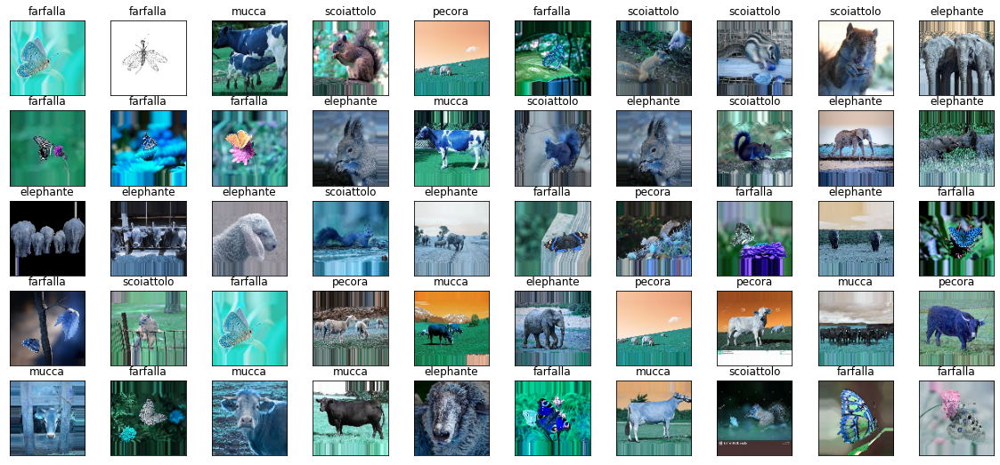

In [ ]:
plt.figure(figsize=(20,9))
for i in range(50):
    plt.subplot(5,10,i+1)
    plt.xticks([])
    plt.yticks([])
    rand_no = random.randint(0,len(test)) 
    plt.title(result.loc[rand_no][0])    
    plt.imshow(test[rand_no])

## Transfer Learning

In [ ]:
# define input shape
INPUT_SHAPE = (96,96, 3)

# get the VGG19 model
vgg_layers = tf.keras.applications.vgg19.VGG19(weights='imagenet', include_top=False, 
                                               input_shape=INPUT_SHAPE)

vgg_layers.summary()

Model: "vgg19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 96, 96, 3)]       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 96, 96, 64)        1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 96, 96, 64)        36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 48, 48, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 48, 48, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 48, 48, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 24, 24, 128)       0     

In [ ]:
# Fine-tune all the layers
for layer in vgg_layers.layers:
    layer.trainable = True

# Check the trainable status of the individual layers
for layer in vgg_layers.layers:
    print(layer, layer.trainable)

<tensorflow.python.keras.engine.input_layer.InputLayer object at 0x7f534f26d550> True
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f534edcbba8> True
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f534ea88e10> True
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x7f534c61da90> True
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f534edde0f0> True
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f534eddef28> True
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x7f534013c3c8> True
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f534013cb70> True
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f53401489e8> True
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f5340148a90> True
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f534014f9e8> True
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x7f5340156

In [ ]:
# define sequential model
model_vgg = tf.keras.models.Sequential()
weight_decay=0.0005
# Add the vgg convolutional base model
model_vgg.add(vgg_layers)

model_vgg.add(Flatten())
model_vgg.add(Dense(512,kernel_regularizer=regularizers.l2(weight_decay)))
model_vgg.add(Activation('relu'))
model_vgg.add(BatchNormalization())

model_vgg.add(Dropout(0.5))
model_vgg.add(Dense(5))
model_vgg.add(Activation('softmax'))

# compile model
model_vgg.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=2e-5), 
              loss='categorical_crossentropy', 
              metrics=['accuracy'])

# view model layers
model_vgg.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg19 (Functional)           (None, 3, 3, 512)         20024384  
_________________________________________________________________
flatten (Flatten)            (None, 4608)              0         
_________________________________________________________________
dense (Dense)                (None, 512)               2359808   
_________________________________________________________________
activation (Activation)      (None, 512)               0         
_________________________________________________________________
batch_normalization (BatchNo (None, 512)               2048      
_________________________________________________________________
dropout (Dropout)            (None, 512)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 5)                 2

In [ ]:
EPOCHS = 100
es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, 
                                               restore_best_weights=True,
                                               verbose=1)
checkpoint = ModelCheckpoint("Vgg.hdf5",monitor='val_loss', verbose=1, mode='auto',save_best_only=True)
history_vgg = model_vgg.fit(datagen.flow(X_train, y_train, batch_size=32),
                              steps_per_epoch=X_train.shape[0] // 32,
                              validation_data=(X_test, y_test),
                              epochs = 100, 
                              callbacks=[es_callback, tensorboard_callback,checkpoint],
                              verbose=1)

Epoch 1/100
  1/204 [..............................] - ETA: 0s - loss: 3.6435 - accuracy: 0.1875WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.
204/204 [==============================] - ETA: 0s - loss: 1.5652 - accuracy: 0.5825
Epoch 00001: val_loss improved from inf to 1.21923, saving model to Vgg.hdf5
204/204 [==============================] - 28s 139ms/step - loss: 1.5652 - accuracy: 0.5825 - val_loss: 1.2192 - val_accuracy: 0.6585
Epoch 2/100
204/204 [==============================] - ETA: 0s - loss: 1.0136 - accuracy: 0.7751
Epoch 00002: val_loss improved from 1.21923 to 0.86896, saving model to Vgg.hdf5
204/204 [==============================] - 27s 131ms/step - loss: 1.0136 - accuracy: 0.7751 - val_loss: 0.8690 - val_accuracy: 0.8244
Epoch 3/100
204/20

In [ ]:
dataset_path = "animal_dataset_intermediate/train"
datagen = ImageDataGenerator(rescale=1.0/255.0,
                             rotation_range=10,
                                           width_shift_range=0.1,
                                           height_shift_range=0.1,
                                           shear_range=0.1,
                                           zoom_range=0.1,
                                           horizontal_flip=True, 
                                           validation_split=0.1)
 
train_data = datagen.flow_from_directory(dataset_path,
                                         target_size=(224,224),
    batch_size=64,
    class_mode='categorical',
    shuffle=True,
    subset='training')
 
test_data = datagen.flow_from_directory(
    dataset_path, # same directory as training data
    target_size=(224,224),
    batch_size=64,
    class_mode='categorical',
    shuffle=False,
    subset='validation')

Found 7378 images belonging to 5 classes.
Found 818 images belonging to 5 classes.


In [ ]:
def lr_scheduler(epoch):
    return learning_rate * (0.5 ** (epoch // lr_drop))
reduce_lr = keras.callbacks.LearningRateScheduler(lr_scheduler)

In [ ]:
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

filepath="weights-improvement-trial5-{epoch:02d}.hdf5"
checkpoint = ModelCheckpoint(filepath,monitor='val_loss', verbose=1, mode='min',save_best_only=True)

callbacks_list = [checkpoint]


tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir, histogram_freq=0)
callbacks_list += [tensorboard_callback]

In [ ]:
# define input shape
INPUT_SHAPE = (224,224, 3)

# get the VGG19 model
vgg_layers = tf.keras.applications.vgg19.VGG19(weights='imagenet', include_top=False, 
                                               input_shape=INPUT_SHAPE)

vgg_layers.summary()

Model: "vgg19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [ ]:
# Fine-tune all the layers
for layer in vgg_layers.layers:
    layer.trainable = True

# Check the trainable status of the individual layers
for layer in vgg_layers.layers:
    print(layer, layer.trainable)

<tensorflow.python.keras.engine.input_layer.InputLayer object at 0x7f05e6f0fa58> True
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f081376ef60> True
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f0813773ac8> True
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x7f080a9d5320> True
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f0813172518> True
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f081376ee80> True
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x7f0812094ef0> True
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f07c5400ef0> True
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f07c4089710> True
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f07c41fd128> True
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f07c541c908> True
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x7f07c406b

In [ ]:
# define sequential model
model = tf.keras.models.Sequential()

# Add the vgg convolutional base model
model.add(vgg_layers)

model.add(Flatten())
model.add(Dense(512,kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('relu'))
model.add(BatchNormalization())

model.add(Dropout(0.5))
model.add(Dense(5))
model.add(Activation('softmax'))

# compile model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=2e-5), 
              loss='categorical_crossentropy', 
              metrics=['accuracy'])

# view model layers
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg19 (Functional)           (None, 7, 7, 512)         20024384  
_________________________________________________________________
flatten_1 (Flatten)          (None, 25088)             0         
_________________________________________________________________
dense_2 (Dense)              (None, 512)               12845568  
_________________________________________________________________
activation_205 (Activation)  (None, 512)               0         
_________________________________________________________________
batch_normalization_204 (Bat (None, 512)               2048      
_________________________________________________________________
dropout_1 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 5)                

In [ ]:
EPOCHS = 100
es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, 
                                               restore_best_weights=True,
                                               verbose=1)

history = model.fit(train_data,
                    batch_size=32,
                    callbacks=[es_callback], 
                    validation_data=test_data, epochs=EPOCHS,
                    verbose=1)



Epoch 1/100
97/97 [==============================] - 132s 1s/step - loss: 1.3512 - accuracy: 0.6835 - val_loss: 1.0787 - val_accuracy: 0.7690
Epoch 2/100
97/97 [==============================] - 132s 1s/step - loss: 0.7772 - accuracy: 0.8848 - val_loss: 0.7146 - val_accuracy: 0.9019
Epoch 3/100
97/97 [==============================] - 132s 1s/step - loss: 0.6528 - accuracy: 0.9286 - val_loss: 0.8046 - val_accuracy: 0.8677
Epoch 4/100
97/97 [==============================] - 132s 1s/step - loss: 0.5860 - accuracy: 0.9486 - val_loss: 0.6306 - val_accuracy: 0.9312
Epoch 5/100
97/97 [==============================] - 132s 1s/step - loss: 0.5357 - accuracy: 0.9632 - val_loss: 0.5919 - val_accuracy: 0.9429
Epoch 6/100
97/97 [==============================] - 132s 1s/step - loss: 0.5098 - accuracy: 0.9681 - val_loss: 0.5740 - val_accuracy: 0.9536
Epoch 7/100
97/97 [==============================] - 132s 1s/step - loss: 0.5034 - accuracy: 0.9712 - val_loss: 0.5977 - val_accuracy: 0.9370
Epoch 

In [ ]:
dataset_path = "animal_dataset_intermediate/train"
datagen = ImageDataGenerator(rescale=1.0/255.0,
                             rotation_range=10,
                                           width_shift_range=0.1,
                                           height_shift_range=0.1,
                                           shear_range=0.1,
                                           zoom_range=0.1,
                                           horizontal_flip=True, 
                                           validation_split=0.1)
 
train_data = datagen.flow_from_directory(dataset_path,
                                         target_size=(298,298),
    batch_size=64,
    class_mode='categorical',
    shuffle=True,
    subset='training')
 
test_data = datagen.flow_from_directory(
    dataset_path, # same directory as training data
    target_size=(298,298),
    batch_size=64,
    class_mode='categorical',
    shuffle=False,
    subset='validation')

In [ ]:
# define input shape
INPUT_SHAPE = (298,298, 3)

# get the VGG19 model
resnet_layers = tf.keras.applications.InceptionResNetV2(weights='imagenet', include_top=False, 
                                               input_shape=INPUT_SHAPE)

resnet_layers.summary()

Model: "inception_resnet_v2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 298, 298, 3) 0                                            
__________________________________________________________________________________________________
conv2d_409 (Conv2D)             (None, 148, 148, 32) 864         input_3[0][0]                    
__________________________________________________________________________________________________
batch_normalization_410 (BatchN (None, 148, 148, 32) 96          conv2d_409[0][0]                 
__________________________________________________________________________________________________
activation_411 (Activation)     (None, 148, 148, 32) 0           batch_normalization_410[0][0]    
________________________________________________________________________________

In [ ]:
# Fine-tune all the layers
for layer in resnet_layers.layers:
    layer.trainable = True

# Check the trainable status of the individual layers
for layer in resnet_layers.layers:
    print(layer, layer.trainable)


# define sequential model
model = tf.keras.models.Sequential()
weight_decay=0.0005
# Add the vgg convolutional base model
model.add(resnet_layers)

model.add(Conv2D(512, (3, 3), padding='same',kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))

model.add(Conv2D(512, (3, 3), padding='same',kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))

model.add(Conv2D(512, (3, 3), padding='same',kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('relu'))
model.add(BatchNormalization())

model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.5))
model.add(Flatten())
model.add(Dense(512,kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('relu'))
model.add(BatchNormalization())

model.add(Dropout(0.5))
model.add(Dense(5))
model.add(Activation('softmax'))

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=2e-5), 
              loss='categorical_crossentropy', 
              metrics=['accuracy'])

# view model layers
model.summary()

<tensorflow.python.keras.engine.input_layer.InputLayer object at 0x7f573488ee48> True
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f5733426ef0> True
<tensorflow.python.keras.layers.normalization_v2.BatchNormalization object at 0x7f5733429320> True
<tensorflow.python.keras.layers.core.Activation object at 0x7f57334299b0> True
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f5733429748> True
<tensorflow.python.keras.layers.normalization_v2.BatchNormalization object at 0x7f573352bf60> True
<tensorflow.python.keras.layers.core.Activation object at 0x7f57335362e8> True
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f5733536320> True
<tensorflow.python.keras.layers.normalization_v2.BatchNormalization object at 0x7f573350d828> True
<tensorflow.python.keras.layers.core.Activation object at 0x7f573350dbe0> True
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x7f573350dc18> True
<tensorflow.python.keras.layers.convolutiona

In [ ]:
EPOCHS = 5
#train_images_3ch_scaled = train_images_3ch / 255.
es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, 
                                               restore_best_weights=True,
                                               verbose=1)

history = model.fit(train_data,
                    batch_size=32,
                    callbacks=[es_callback], 
                    validation_data=test_data, epochs=EPOCHS,
                    verbose=1)

Epoch 1/5
116/116 [==============================] - 213s 2s/step - loss: 0.9418 - accuracy: 0.9993 - val_loss: 0.9847 - val_accuracy: 0.9841
Epoch 2/5
116/116 [==============================] - 212s 2s/step - loss: 0.9327 - accuracy: 0.9991 - val_loss: 0.9627 - val_accuracy: 0.9890
Epoch 3/5
116/116 [==============================] - 213s 2s/step - loss: 0.9241 - accuracy: 0.9991 - val_loss: 0.9441 - val_accuracy: 0.9902
Epoch 4/5
116/116 [==============================] - 212s 2s/step - loss: 0.9122 - accuracy: 0.9993 - val_loss: 0.9353 - val_accuracy: 0.9927
Epoch 5/5
116/116 [==============================] - 212s 2s/step - loss: 0.9053 - accuracy: 0.9988 - val_loss: 0.9393 - val_accuracy: 0.9927


In [ ]:
import cv2
test_file=pd.read_csv('animal_dataset_intermediate/Testing_set_animals.csv')
test_img=[]
for i in test_file['filename']:
    n= cv2.imread('animal_dataset_intermediate/test/'+i)
    r = cv2.resize(n, (298,298))
    test_img.append(r)
test_img = np.array(test_img)
test_img = test_img/255

In [ ]:
predictions = model.predict(test_img)
classes = ['elefante', 'farfalla','mucca','pecora', 'scoiattolo']
mapping = {0:'elefante', 1:'farfalla', 2:'mucca', 3:'pecora', 4:'scoiattolo'  }
preds = []
for i in range(len(predictions)):
    preds.append(np.argmax(predictions[i], axis=-1))
preds = pd.Series(preds)
predsOri = preds.map(mapping)
Ass2 =predsOri.to_list()
Ass2 = np.array(Ass2)
Ass2.tofile('ass2.csv', sep=',')